In [5]:
import pandas as pd
import nltk
import spacy
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()
from top2vec import Top2Vec

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\33768\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [2]:
sid.polarity_scores("today's rally called traitor confirmed words mikael minasyan nikol dead long time.he corpse stinks, walks streets. speaks")


{'neg': 0.417, 'neu': 0.583, 'pos': 0.0, 'compound': -0.875}

In [3]:
sid.polarity_scores('hello there stupid')['compound']


-0.5267

In [7]:
df=pd.read_csv("model_2_results_positive_from30000samples.csv")


*Preprocessing function, not very useful here since stop words, exclamation marks etc are meaningful in sentiment analyssi*

In [55]:
def preprocess(df):
    
    smell_words=["Stink","Scent","Smell","Odour","Odor","Stench","Reek","Aroma","Aromatic","Whiff","Foetor","Fetor","Fragrance","Musk","Rankness","Redolence","Pong","Pungency","Niff","Deodorant","Essence","Atmosphere","Olfaction",
                               "Stinking","Stank","Stunk","Scented","Odourless","Odoriferous","Odorous","Malodorous","Reeking","Aromatic","Whiffy","Fetid","Foetid","Fragrant","Fragranced","Redolent","Frowzy","Frowsy","Pungent","Funky","Musty","Niffy","Unscented","Scentless","Deodorized","Noisome","Smelly","Mepehitic","Muddle","Putrid","Olfactory","Musky","Pungently",
                               "Smelling","Smelled","Reeked","Sniff","Sniffed","Sniffing","Whiffed","Deodorized","Deodorizing","Snuffing","Snuffed"]
    smell_words_lower=[x.lower() for x in smell_words]

    my_words=['love', 'good', 'new','stink', 'stank',"n't", 'ca', "'s", "gon", 'na', 'll', 't', 'ur', 'bc', 'nt', 'yo', 've', 'ai','lol','cause', ]

    # stop = stopwords.words('english')
    s= set(ENGLISH_STOP_WORDS).union(smell_words).union(my_words).union(smell_words_lower) #.union(set(stop))
    
    #taking off links
    df['Text']=df['sentence'].apply(lambda x: re.split('http*:\/\/.*', str(x))[0])
    df['Text']=df['Text'].apply(lambda x: re.split('https*:\/\/.*', str(x))[0])

    # make everything lower case, Not done for proper nouns
    df['Text'] = df['Text'].str.lower()

    #take off stop words
    df['Text_clean'] = df['Text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (s)]))
    
    # only take a lsit of clean texts, since that is what the moel needs as input : a list
    docs = list(df['Text_clean'].loc[:].values)
    
    # lemmatization
    
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
    
    lem_token= [nlp(sentence) for sentence in docs] 
    lem_doc= [" ".join([token.lemma_ for token in tok]) for tok in lem_token]
    clean_lem = [' '.join([word for word in row.split() if word not in (s)]) for row in lem_doc]
    
    clean_lem[:5]

    return clean_lem
    


In [40]:
def positive_sentences(df,min_score=0.5):
    df['score'] = df.apply (lambda row: sid.polarity_scores(row.sentence)['compound'], axis=1)
    positive_sentences = list(df[df.score > min_score].sentence.loc[:].values)
 
    print("Here are the",len(positive_sentences), "sentences that scored over", min_score, ": \n")    
    return positive_sentences
    
def negative_sentences(df,max_score=-0.5):
    df['score'] = df.apply (lambda row: sid.polarity_scores(row.sentence)['compound'], axis=1)
    negative_sentences = list(df[df.score < max_score].sentence.loc[:].values)
 
    print("Here are the",len(negative_sentences), "sentences that scored under", max_score, ": \n")    
    return negative_sentences
    
    

In [42]:
neg_sentences = negative_sentences(df,-0.5)

Here are the 4173 sentences that scored under -0.5 : 



In [43]:
neg_df = pd.DataFrame(data = neg_sentences, columns=['sentence'])


In [56]:
clean_neg = preprocess(neg_df)

In [57]:
model_neg = Top2Vec(clean_neg)

2021-05-21 02:49:28,355 - top2vec - INFO - Pre-processing documents for training
2021-05-21 02:49:29,131 - top2vec - INFO - Creating joint document/word embedding
2021-05-21 02:50:00,704 - top2vec - INFO - Creating lower dimension embedding of documents
2021-05-21 02:50:22,291 - top2vec - INFO - Finding dense areas of documents
2021-05-21 02:50:23,989 - top2vec - INFO - Finding topics


In [58]:
model_neg.get_num_topics()


9

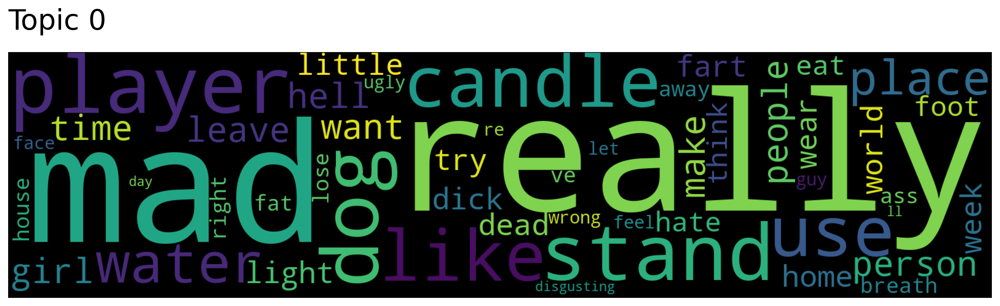

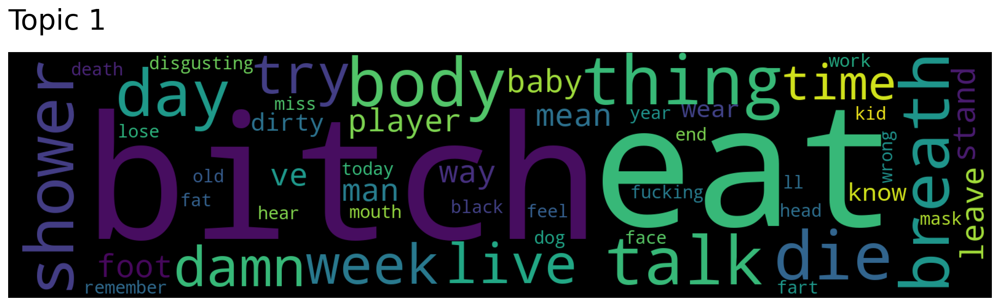

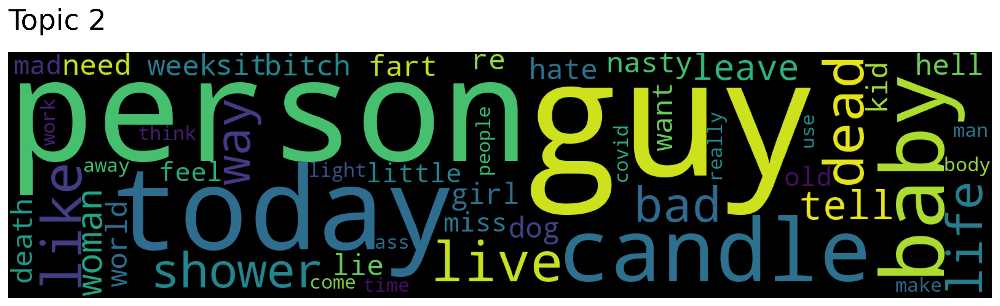

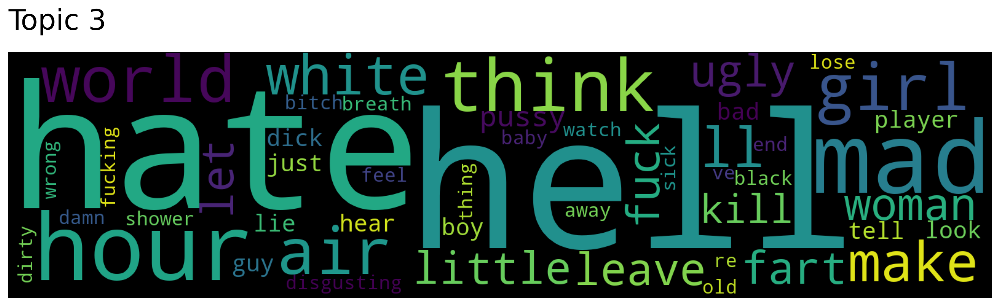

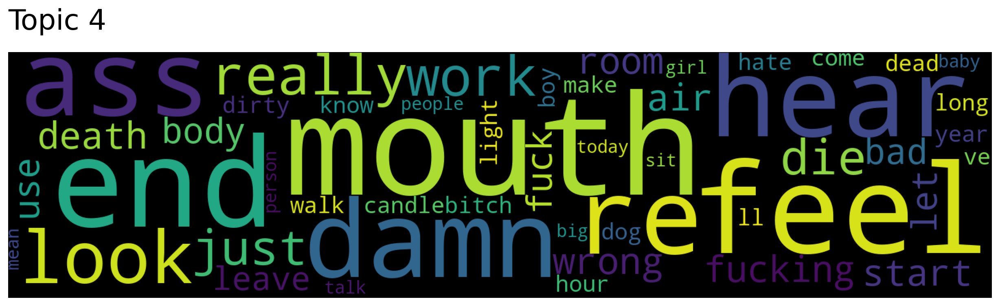

...

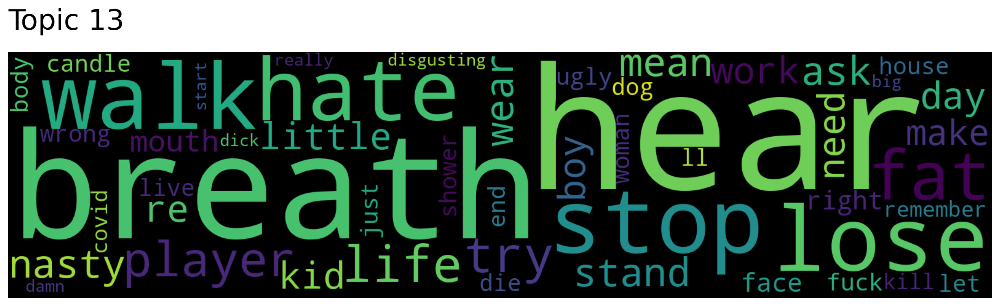

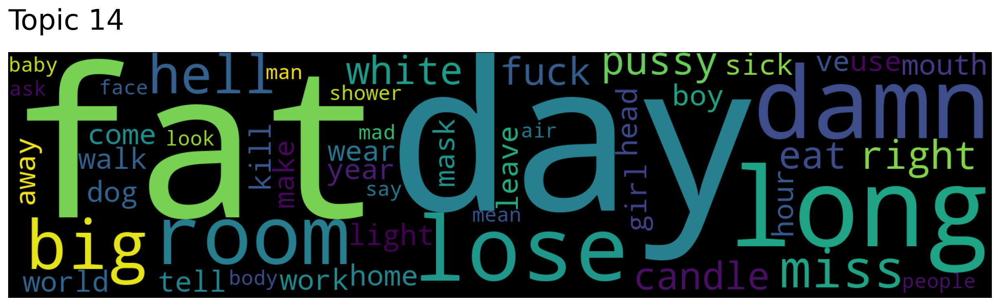

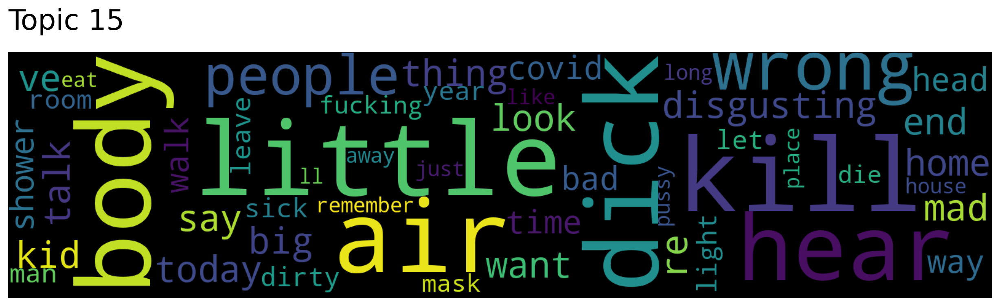

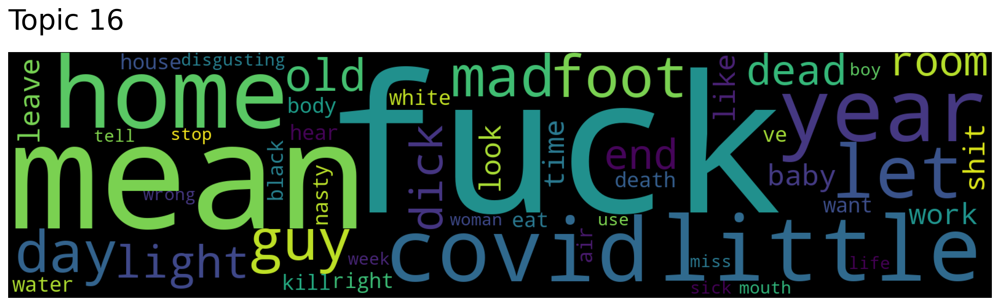

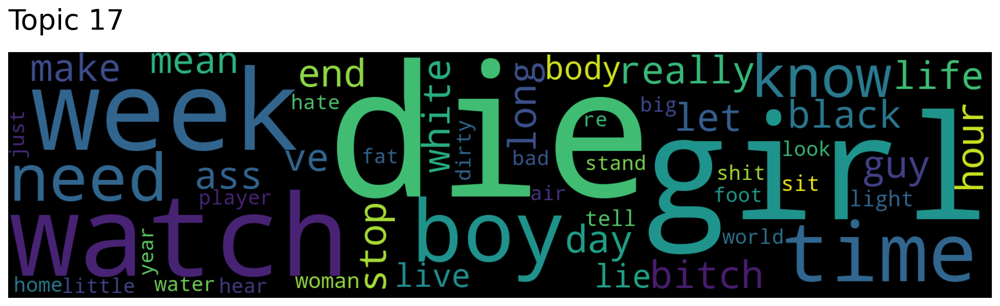

In [54]:
topic_words, word_scores, topic_nums = model_neg.get_topics(model_neg.get_num_topics())
for topic in topic_nums:
    model_neg.generate_topic_wordcloud(topic)


In [10]:
pos_sentences = positive_sentences(df,0.5)

Here are the 4774 sentences that scored over 0.5 : 



In [25]:
pos_df = pd.DataFrame(data = pos_sentences, columns=['sentence'])


In [27]:
clean_pos = preprocess(pos_df)

In [29]:
model = Top2Vec(clean_pos)

2021-05-21 02:17:38,269 - top2vec - INFO - Pre-processing documents for training
2021-05-21 02:17:39,596 - top2vec - INFO - Creating joint document/word embedding
2021-05-21 02:18:19,812 - top2vec - INFO - Creating lower dimension embedding of documents
2021-05-21 02:19:54,537 - top2vec - INFO - Finding dense areas of documents
2021-05-21 02:19:56,357 - top2vec - INFO - Finding topics


In [30]:
model.get_num_topics()

2

In [32]:
topic_words, word_scores, topic_nums = model.get_topics(model.get_num_topics())


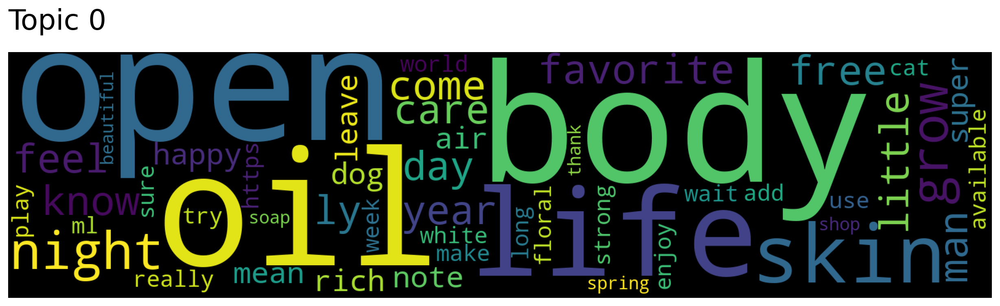

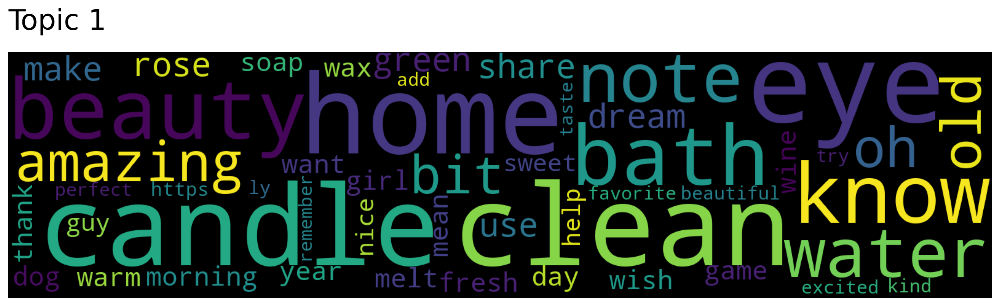

In [33]:
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)
